In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST,ImageFolder
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)


def show_tensor_images(image_tensor,num_images=25,size=(1,128,128)):
    print(image_tensor.shape)
    image_tensor=(image_tensor+1)/2
    image_unflat=image_tensor.detach().cpu()
    image_grid= make_grid(image_unflat[:num_images],nrow=5)
    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()
    

In [2]:
class Generator(nn.Module):
    def __init__(self,z_dim=10,im_chan=3,hidden_dim=64):
        super(Generator,self).__init__()
        self.z_dim=z_dim
        self.gen=nn.Sequential(
        self.make_gen_block(z_dim,hidden_dim*8,kernel_size=4,stride=1,padding=0), # ch x 4 x4
        self.make_gen_block(hidden_dim * 8,hidden_dim * 4,kernel_size=4,stride=2,padding=1),  #ch x 8 x8
        self.make_gen_block(hidden_dim * 4,hidden_dim*2,kernel_size=4,stride=2,padding=1), # ch x 16 x 16
        self.make_gen_block(hidden_dim * 2,hidden_dim*1,kernel_size=4,stride=2,padding=1), # ch x 32 x 32
        self.make_gen_block(hidden_dim * 1,hidden_dim*1,kernel_size=4,stride=2,padding=1), # ch x 64 x 64
        self.make_gen_block(hidden_dim,im_chan,kernel_size=4,stride=2,padding=1,final_layer=True), # 128 X 128
        )
        
    def make_gen_block(self, input_channels,output_channels,kernel_size=3,stride=2,padding=0,final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels,output_channels,kernel_size,stride,padding),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
                
            )
        else:
            return nn.Sequential(
            nn.ConvTranspose2d(input_channels,output_channels,kernel_size,stride,padding),
            nn.Tanh()
            
            )
    def unsqueeze_noise(self,noise):
        return noise.view(len(noise),self.z_dim,1,1)
    
    def forward(self,noise):
        x=self.unsqueeze_noise(noise)
        return self.gen(x)
    
    
    
    
def get_noise(n_sample,z_dim,device='cpu'):
    return torch.randn(n_sample,z_dim,device=device)
    

In [3]:
class Discriminator(nn.Module):
    def __init__(self,im_chan=3,hidden_dim=16):
        super(Discriminator,self).__init__()
        self.disc=nn.Sequential(
        self.make_disc_block(im_chan,hidden_dim),
        self.make_disc_block(hidden_dim,hidden_dim*2),
        self.make_disc_block(hidden_dim*2,hidden_dim*4),
        self.make_disc_block(hidden_dim*4,hidden_dim*8),
        self.make_disc_block(hidden_dim*8,1,kernel_size=4,stride=1,padding=0,final_layer=True),
        )
    
    def make_disc_block(self,input_channels,output_channels,kernel_size=4,stride=2,padding=1,final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels,output_channels,kernel_size,stride,padding),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2)
            )
        else:
            return nn.Sequential(
            nn.Conv2d(input_channels,output_channels,kernel_size,stride,padding),
#             nn.LeakyReLU(0.2)
        )
        
    def forward(self,image):
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred),-1)

In [4]:
criterion=nn.BCEWithLogitsLoss()
z_dim=128
display_step=500
batch_size=128
lr=0.0002

beta_1=0.5
beta_2=0.999
device='cuda'

transform=transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

data=ImageFolder(root="P:/dataset/Flickr-Faces/thumbnails128x128",transform=transform)
dataloader=DataLoader(dataset=data,batch_size=batch_size,shuffle=True,num_workers=4)

# dataloader=DataLoader(
# MNIST('.',download=False,transform=transform),
# batch_size=batch_size,
# shuffle=True
# )


In [5]:
gen=Generator(z_dim).to(device)
gen_opt=torch.optim.Adam(gen.parameters(),lr=lr,betas=(beta_1,beta_2))
disc=Discriminator().to(device)
disc_opt=torch.optim.Adam(disc.parameters(),lr=lr,betas=(beta_1,beta_2))
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)


Step / Epoch : 500 / 0 :Generator loss: 0.9389619246721276, discriminator loss: 0.606285599052906
torch.Size([128, 3, 128, 128])


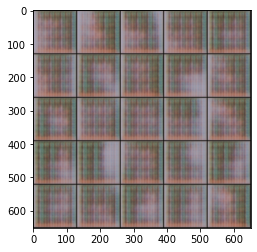

torch.Size([128, 3, 128, 128])


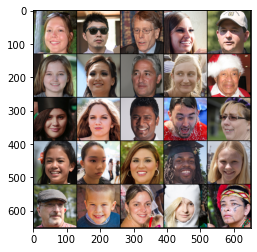

Step / Epoch : 1000 / 1 :Generator loss: 0.9152612010240546, discriminator loss: 0.6432483673691758
torch.Size([128, 3, 128, 128])


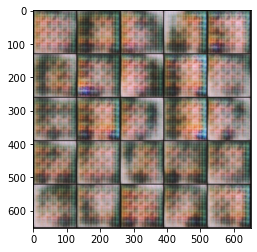

torch.Size([128, 3, 128, 128])


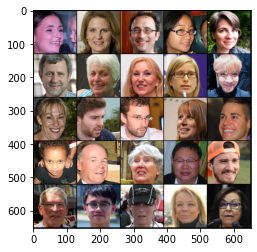

Step / Epoch : 1500 / 2 :Generator loss: 0.7714257640838628, discriminator loss: 0.681460440516472
torch.Size([128, 3, 128, 128])


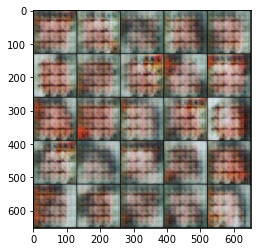

torch.Size([128, 3, 128, 128])


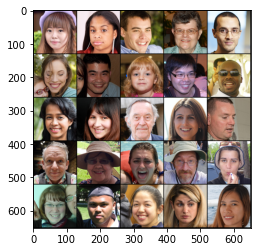

Step / Epoch : 2000 / 3 :Generator loss: 0.7379042975902558, discriminator loss: 0.6853777936697002
torch.Size([128, 3, 128, 128])


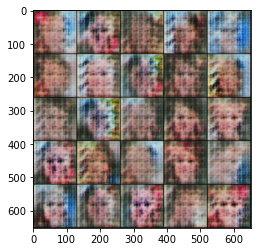

torch.Size([128, 3, 128, 128])


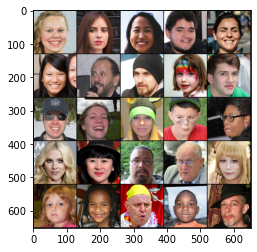

Step / Epoch : 2500 / 4 :Generator loss: 0.7421334142684933, discriminator loss: 0.6842034541368485
torch.Size([128, 3, 128, 128])


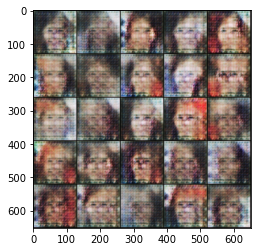

torch.Size([128, 3, 128, 128])


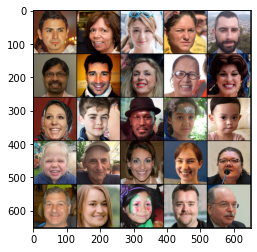

Step / Epoch : 3000 / 5 :Generator loss: 0.763595009922982, discriminator loss: 0.6826381796598435
torch.Size([128, 3, 128, 128])


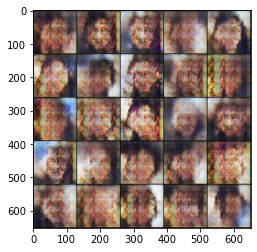

torch.Size([128, 3, 128, 128])


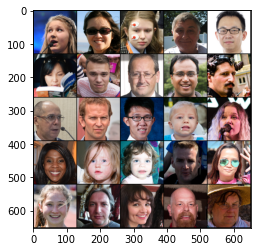

Step / Epoch : 3500 / 6 :Generator loss: 0.7529907414913165, discriminator loss: 0.6853155230283737
torch.Size([128, 3, 128, 128])


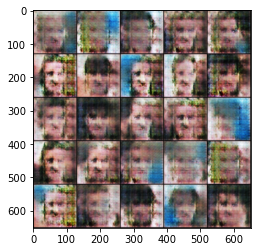

torch.Size([128, 3, 128, 128])


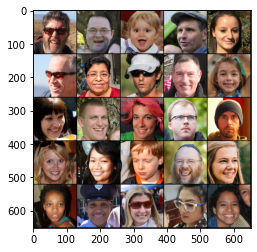

Step / Epoch : 4000 / 7 :Generator loss: 0.7451753088235852, discriminator loss: 0.6858829222917555
torch.Size([128, 3, 128, 128])


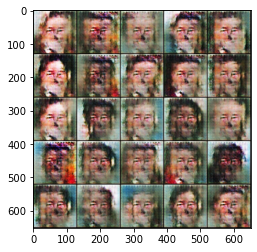

torch.Size([128, 3, 128, 128])


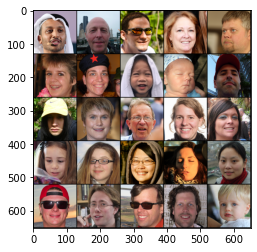

Step / Epoch : 4500 / 8 :Generator loss: 0.7967200797796246, discriminator loss: 0.6754176348447799
torch.Size([128, 3, 128, 128])


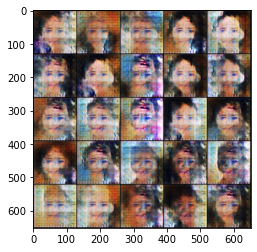

torch.Size([128, 3, 128, 128])


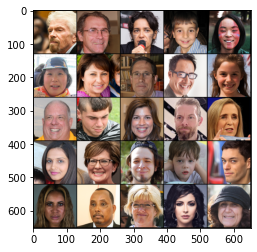

Step / Epoch : 5000 / 9 :Generator loss: 0.8456738734245289, discriminator loss: 0.6674575228691095
torch.Size([128, 3, 128, 128])


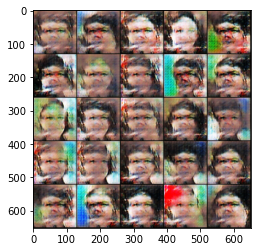

torch.Size([128, 3, 128, 128])


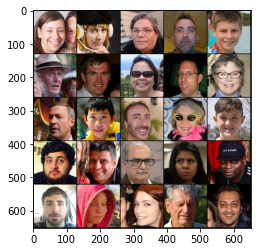

Step / Epoch : 5500 / 10 :Generator loss: 0.8702053544521329, discriminator loss: 0.6632165886163719
torch.Size([128, 3, 128, 128])


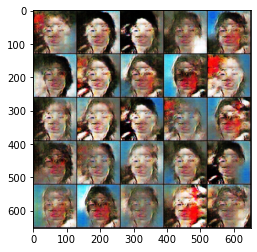

torch.Size([128, 3, 128, 128])


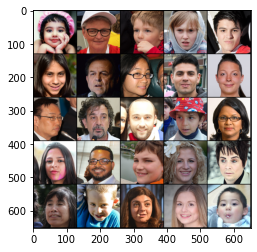

Step / Epoch : 6000 / 11 :Generator loss: 0.8601858829259873, discriminator loss: 0.6580367370843886
torch.Size([128, 3, 128, 128])


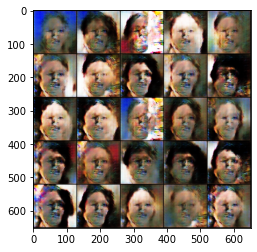

torch.Size([128, 3, 128, 128])


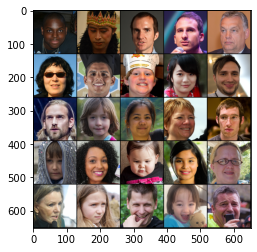

Step / Epoch : 6500 / 12 :Generator loss: 0.8876043136119853, discriminator loss: 0.6561019492149353
torch.Size([128, 3, 128, 128])


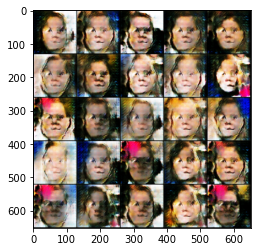

torch.Size([128, 3, 128, 128])


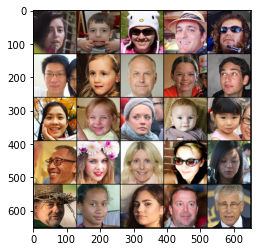

Step / Epoch : 7000 / 13 :Generator loss: 0.9086340405941007, discriminator loss: 0.6508896925449368
torch.Size([128, 3, 128, 128])


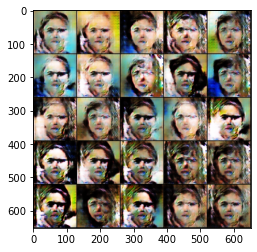

torch.Size([128, 3, 128, 128])


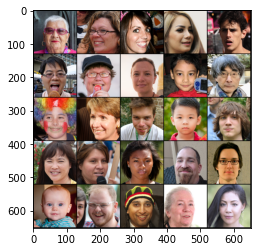

Step / Epoch : 7500 / 14 :Generator loss: 0.9246956280469896, discriminator loss: 0.6470074026584626
torch.Size([128, 3, 128, 128])


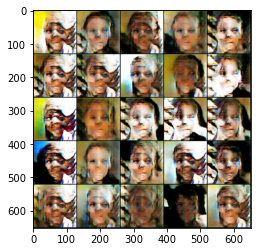

torch.Size([128, 3, 128, 128])


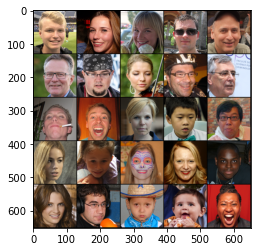

Step / Epoch : 8000 / 15 :Generator loss: 0.932781410217285, discriminator loss: 0.6417712250947956
torch.Size([128, 3, 128, 128])


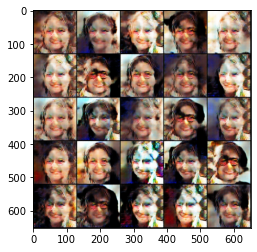

torch.Size([128, 3, 128, 128])


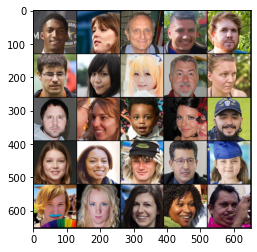

Step / Epoch : 8500 / 16 :Generator loss: 0.9025095255374915, discriminator loss: 0.6475993126630779
torch.Size([128, 3, 128, 128])


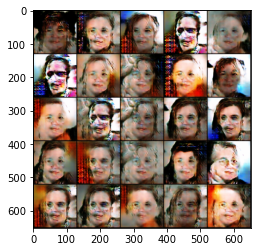

torch.Size([128, 3, 128, 128])


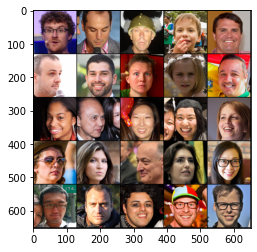

Step / Epoch : 9000 / 17 :Generator loss: 0.9281797168254842, discriminator loss: 0.6432208356857306
torch.Size([128, 3, 128, 128])


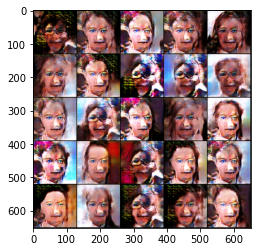

torch.Size([128, 3, 128, 128])


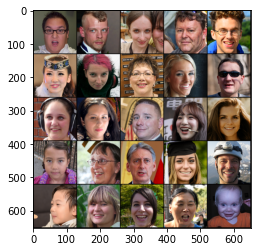

Step / Epoch : 9500 / 18 :Generator loss: 0.9494999901056285, discriminator loss: 0.6420586407780644
torch.Size([128, 3, 128, 128])


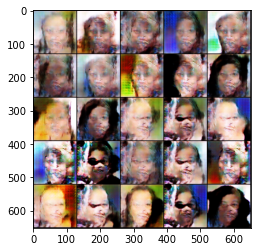

torch.Size([128, 3, 128, 128])


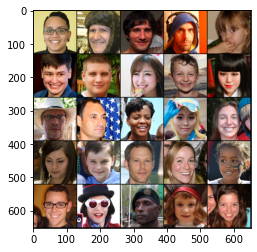

Step / Epoch : 10000 / 19 :Generator loss: 0.9322008718252183, discriminator loss: 0.6407549371719359
torch.Size([128, 3, 128, 128])


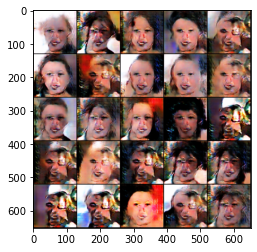

torch.Size([128, 3, 128, 128])


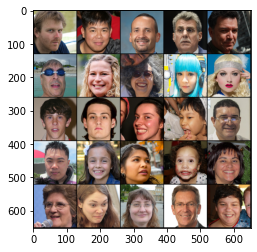

Step / Epoch : 10500 / 20 :Generator loss: 0.9483685543537139, discriminator loss: 0.6373402425050726
torch.Size([128, 3, 128, 128])


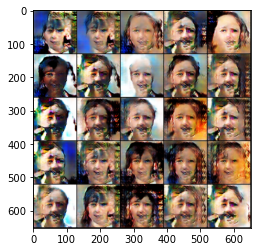

torch.Size([128, 3, 128, 128])


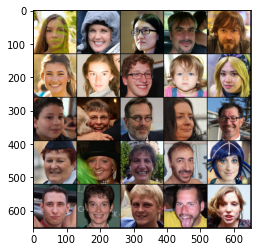

Step / Epoch : 11000 / 21 :Generator loss: 0.9527697460651382, discriminator loss: 0.6332111408710479
torch.Size([128, 3, 128, 128])


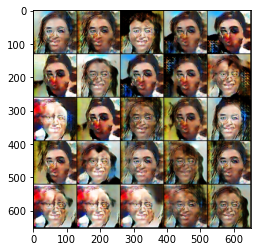

torch.Size([128, 3, 128, 128])


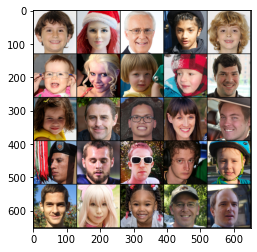

Step / Epoch : 11500 / 22 :Generator loss: 0.9970223413705827, discriminator loss: 0.6266634811162951
torch.Size([128, 3, 128, 128])


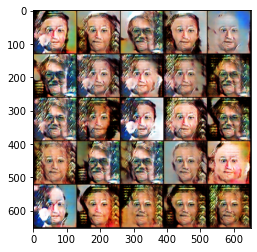

torch.Size([128, 3, 128, 128])


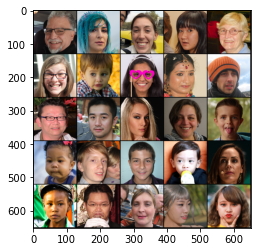

Step / Epoch : 12000 / 23 :Generator loss: 0.9558476964235306, discriminator loss: 0.6411211668252947
torch.Size([128, 3, 128, 128])


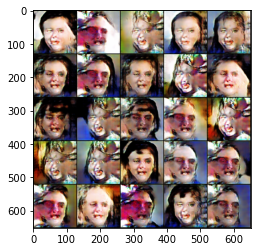

torch.Size([128, 3, 128, 128])


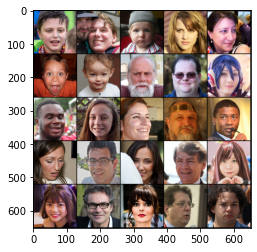

Step / Epoch : 12500 / 24 :Generator loss: 0.9632077168226243, discriminator loss: 0.6281939225196835
torch.Size([128, 3, 128, 128])


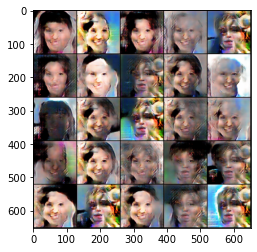

torch.Size([128, 3, 128, 128])


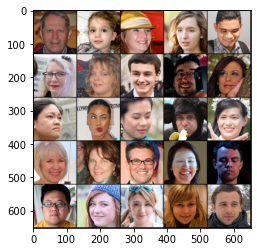

Step / Epoch : 13000 / 25 :Generator loss: 0.9466008718013765, discriminator loss: 0.6374470899105077
torch.Size([128, 3, 128, 128])


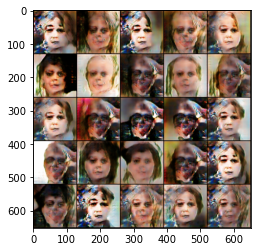

torch.Size([128, 3, 128, 128])


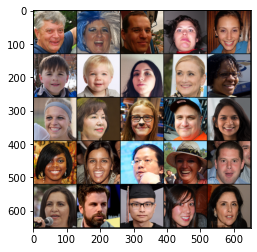

Step / Epoch : 13500 / 26 :Generator loss: 1.001264237165451, discriminator loss: 0.6189646352529526
torch.Size([128, 3, 128, 128])


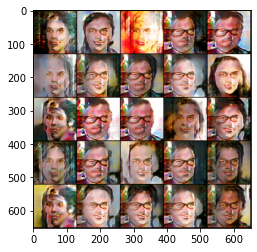

torch.Size([128, 3, 128, 128])


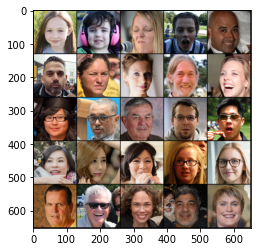

Step / Epoch : 14000 / 27 :Generator loss: 0.9630799989700312, discriminator loss: 0.6293779076337811
torch.Size([128, 3, 128, 128])


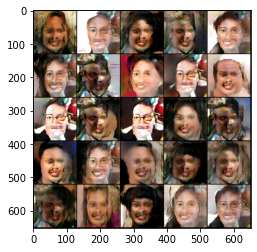

torch.Size([128, 3, 128, 128])


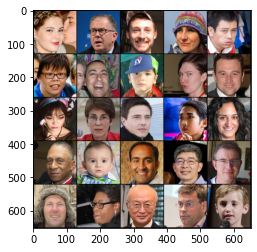

Step / Epoch : 14500 / 28 :Generator loss: 0.9838363215923299, discriminator loss: 0.6204283906221378
torch.Size([128, 3, 128, 128])


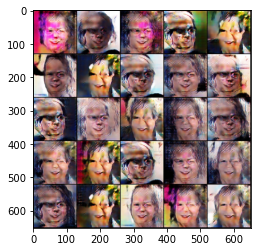

torch.Size([128, 3, 128, 128])


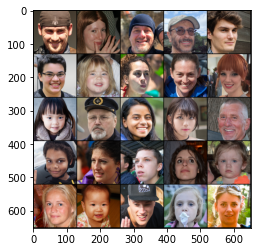

Step / Epoch : 15000 / 29 :Generator loss: 0.9851540690660483, discriminator loss: 0.6251331806182858
torch.Size([128, 3, 128, 128])


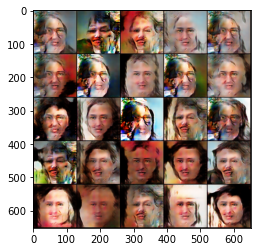

torch.Size([128, 3, 128, 128])


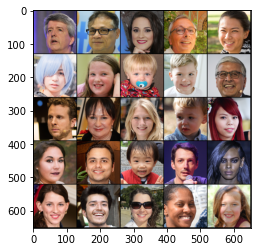

Step / Epoch : 15500 / 30 :Generator loss: 0.972724403738976, discriminator loss: 0.6247540416717525
torch.Size([128, 3, 128, 128])


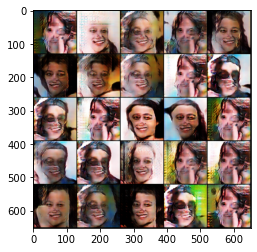

torch.Size([128, 3, 128, 128])


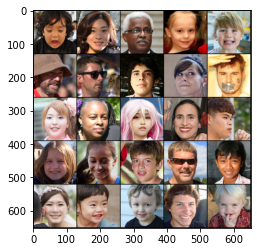

Step / Epoch : 16000 / 31 :Generator loss: 1.0037641001939774, discriminator loss: 0.6177521770000456
torch.Size([128, 3, 128, 128])


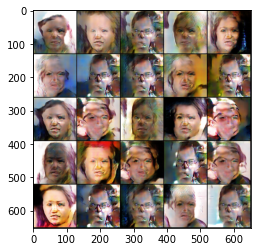

torch.Size([128, 3, 128, 128])


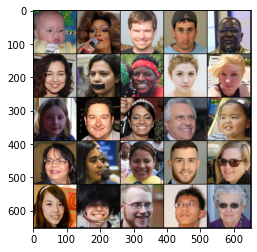

Step / Epoch : 16500 / 32 :Generator loss: 0.9761900053024295, discriminator loss: 0.6223216204643247
torch.Size([128, 3, 128, 128])


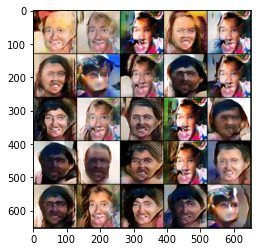

torch.Size([128, 3, 128, 128])


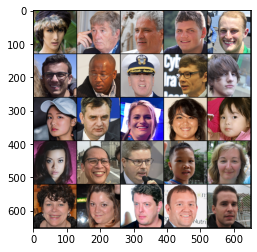

Step / Epoch : 17000 / 33 :Generator loss: 1.004592228710651, discriminator loss: 0.6151969470977783
torch.Size([128, 3, 128, 128])


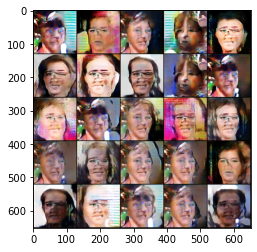

torch.Size([128, 3, 128, 128])


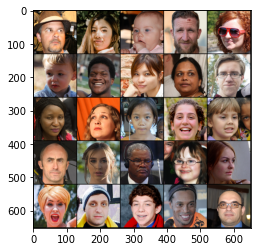

Step / Epoch : 17500 / 34 :Generator loss: 0.9953412248492236, discriminator loss: 0.6264711468219756
torch.Size([128, 3, 128, 128])


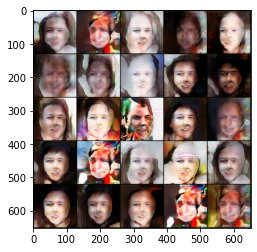

torch.Size([128, 3, 128, 128])


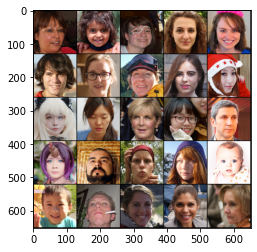

Step / Epoch : 18000 / 35 :Generator loss: 0.9787824511528015, discriminator loss: 0.6203303736448293
torch.Size([128, 3, 128, 128])


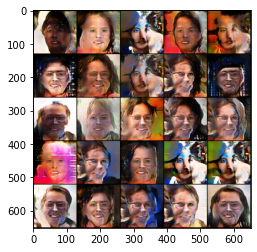

torch.Size([128, 3, 128, 128])


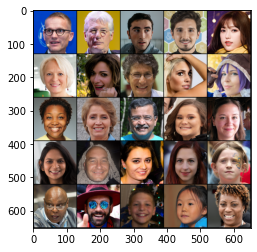

Step / Epoch : 18500 / 36 :Generator loss: 0.9712766524553307, discriminator loss: 0.6238960300683977
torch.Size([128, 3, 128, 128])


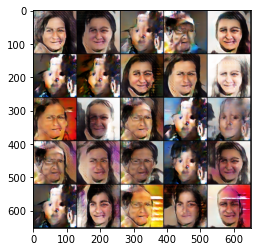

torch.Size([128, 3, 128, 128])


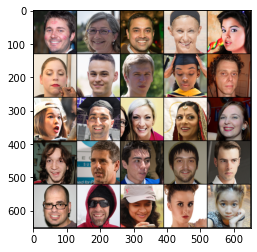

Step / Epoch : 19000 / 37 :Generator loss: 0.9725416799783703, discriminator loss: 0.6255200045108794
torch.Size([128, 3, 128, 128])


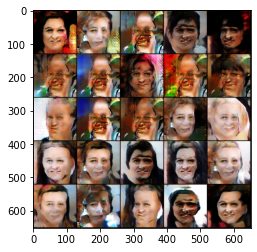

torch.Size([128, 3, 128, 128])


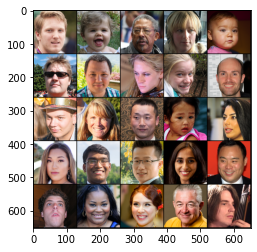

Step / Epoch : 19500 / 38 :Generator loss: 0.9620367500782004, discriminator loss: 0.6257746603488921
torch.Size([128, 3, 128, 128])


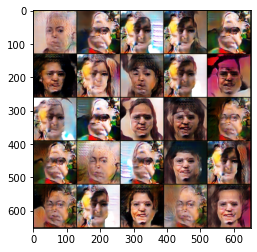

torch.Size([128, 3, 128, 128])


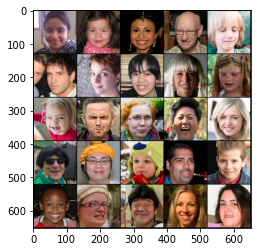

Step / Epoch : 20000 / 39 :Generator loss: 0.9573543345928184, discriminator loss: 0.624909815192222
torch.Size([128, 3, 128, 128])


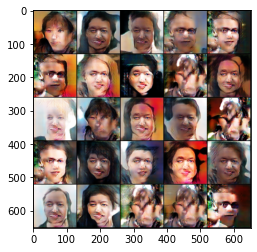

torch.Size([128, 3, 128, 128])


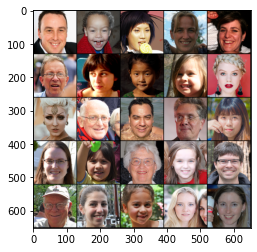

Step / Epoch : 20500 / 40 :Generator loss: 0.9606395870447156, discriminator loss: 0.6234924843311311
torch.Size([128, 3, 128, 128])


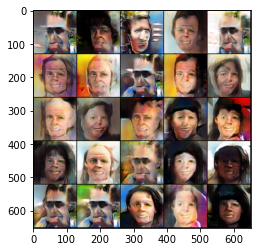

torch.Size([128, 3, 128, 128])


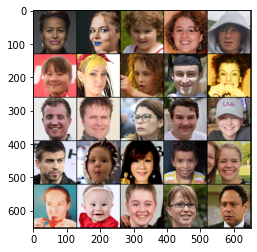

Step / Epoch : 21000 / 41 :Generator loss: 0.947231272816659, discriminator loss: 0.6318387742042542
torch.Size([128, 3, 128, 128])


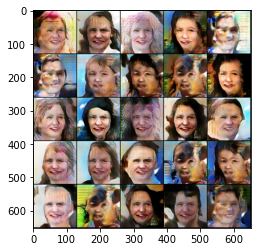

torch.Size([128, 3, 128, 128])


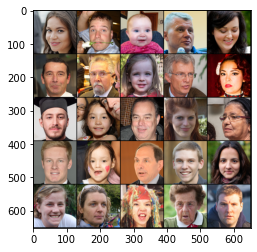

Step / Epoch : 21500 / 41 :Generator loss: 0.947457662701607, discriminator loss: 0.6361557087898249
torch.Size([128, 3, 128, 128])


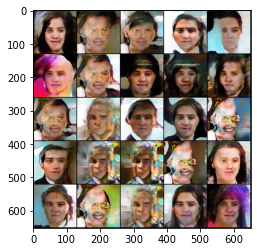

torch.Size([128, 3, 128, 128])


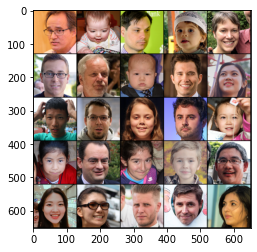

Step / Epoch : 22000 / 42 :Generator loss: 0.9341359683275229, discriminator loss: 0.6400713250637062
torch.Size([128, 3, 128, 128])


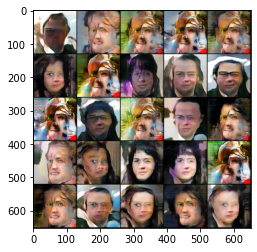

torch.Size([128, 3, 128, 128])


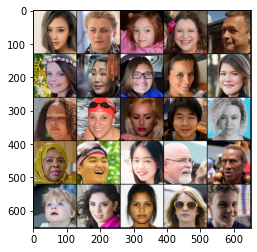

Step / Epoch : 22500 / 43 :Generator loss: 0.925995084166526, discriminator loss: 0.637625710248947
torch.Size([128, 3, 128, 128])


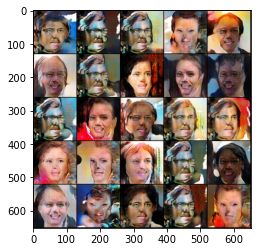

torch.Size([128, 3, 128, 128])


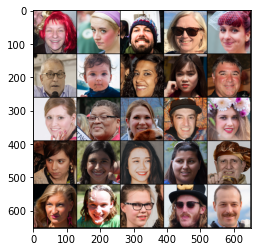

Step / Epoch : 23000 / 44 :Generator loss: 0.9378418002128602, discriminator loss: 0.6398826651573184
torch.Size([128, 3, 128, 128])


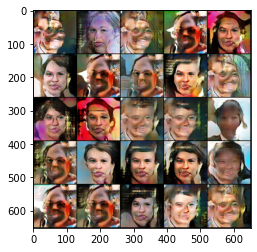

torch.Size([128, 3, 128, 128])


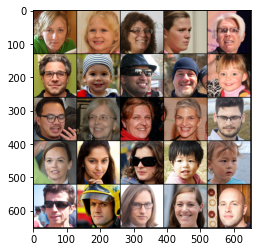

Step / Epoch : 23500 / 45 :Generator loss: 0.928340006589889, discriminator loss: 0.6370690315961838
torch.Size([128, 3, 128, 128])


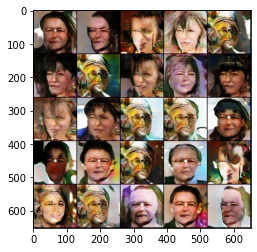

torch.Size([128, 3, 128, 128])


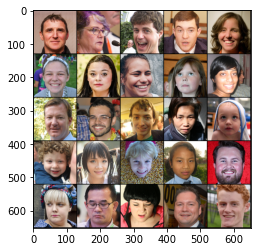

Step / Epoch : 24000 / 46 :Generator loss: 0.9328997025489812, discriminator loss: 0.63685779941082
torch.Size([128, 3, 128, 128])


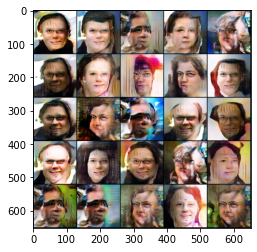

torch.Size([128, 3, 128, 128])


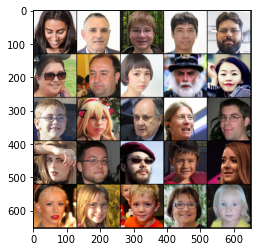

Step / Epoch : 24500 / 47 :Generator loss: 0.9157354699373248, discriminator loss: 0.6476695815324781
torch.Size([128, 3, 128, 128])


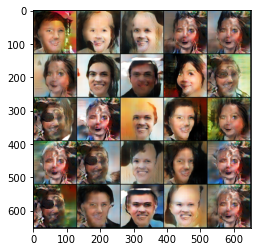

torch.Size([128, 3, 128, 128])


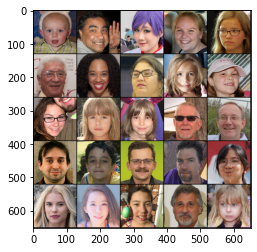

Step / Epoch : 25000 / 48 :Generator loss: 0.9271183105707165, discriminator loss: 0.6417170320749283
torch.Size([128, 3, 128, 128])


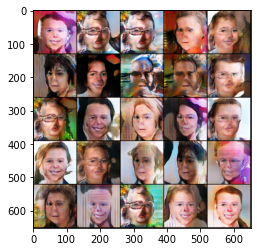

torch.Size([128, 3, 128, 128])


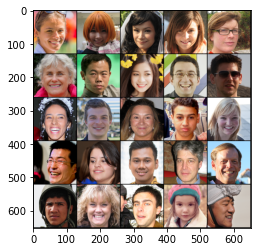

Step / Epoch : 25500 / 49 :Generator loss: 0.9263024786710731, discriminator loss: 0.64049031484127
torch.Size([128, 3, 128, 128])


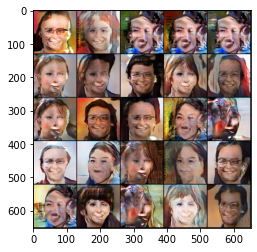

torch.Size([128, 3, 128, 128])


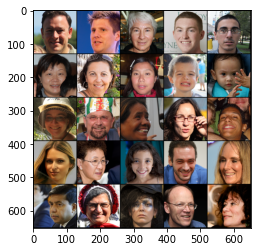

In [6]:
n_epochs=50
cur_step=0
mean_generator_loss=0
mean_discriminator_loss=0

for epoch in range(n_epochs):
  
    for i,(real,_) in enumerate(dataloader):
        cur_batch_size=len(real)
        real=real.to(device)
        
        disc_opt.zero_grad()
        fake_noise=get_noise(cur_batch_size,z_dim,device=device)
        fake=gen(fake_noise)
        disc_fake_pred=disc(fake.detach())
        disc_fake_loss=criterion(disc_fake_pred,torch.zeros_like(disc_fake_pred))
        disc_real_pred=disc(real)
        disc_real_loss=criterion(disc_real_pred,torch.ones_like(disc_real_pred))
        disc_loss =(disc_fake_loss + disc_real_loss)/2
        
        
        mean_discriminator_loss+=disc_loss.item()/display_step
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        
        
        gen_opt.zero_grad()
        fake_noise_2=get_noise(cur_batch_size,z_dim,device=device)
        fake_2=gen(fake_noise_2)
        disc_fake_pred=disc(fake_2)
        gen_loss=criterion(disc_fake_pred,torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()
        
        mean_generator_loss+=gen_loss.item()/display_step
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step / Epoch : {cur_step} / {epoch} :Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
    
        
        

In [24]:
img_list=gen(get_noise(25,z_dim,device=device)).detach().cpu()

In [25]:
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

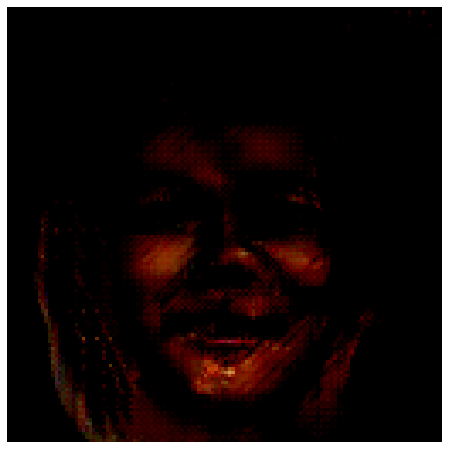

In [26]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [28]:
for param_tensor in gen.state_dict():
    print(param_tensor, "\t", gen.state_dict()[param_tensor].size())

gen.0.0.weight 	 torch.Size([128, 512, 4, 4])
gen.0.0.bias 	 torch.Size([512])
gen.0.1.weight 	 torch.Size([512])
gen.0.1.bias 	 torch.Size([512])
gen.0.1.running_mean 	 torch.Size([512])
gen.0.1.running_var 	 torch.Size([512])
gen.0.1.num_batches_tracked 	 torch.Size([])
gen.1.0.weight 	 torch.Size([512, 256, 4, 4])
gen.1.0.bias 	 torch.Size([256])
gen.1.1.weight 	 torch.Size([256])
gen.1.1.bias 	 torch.Size([256])
gen.1.1.running_mean 	 torch.Size([256])
gen.1.1.running_var 	 torch.Size([256])
gen.1.1.num_batches_tracked 	 torch.Size([])
gen.2.0.weight 	 torch.Size([256, 128, 4, 4])
gen.2.0.bias 	 torch.Size([128])
gen.2.1.weight 	 torch.Size([128])
gen.2.1.bias 	 torch.Size([128])
gen.2.1.running_mean 	 torch.Size([128])
gen.2.1.running_var 	 torch.Size([128])
gen.2.1.num_batches_tracked 	 torch.Size([])
gen.3.0.weight 	 torch.Size([128, 64, 4, 4])
gen.3.0.bias 	 torch.Size([64])
gen.3.1.weight 	 torch.Size([64])
gen.3.1.bias 	 torch.Size([64])
gen.3.1.running_mean 	 torch.Size([64]

In [51]:
torch.save(gen.state_dict(),".\\DCGAN_faces_gen.pickle")

In [52]:
torch.save(disc.state_dict(),".\\DCGAN_faces_disc.pickle")

In [53]:
model = Generator(z_dim)
model.load_state_dict(torch.load(".\\DCGAN_faces_gen.pickle"))
model.eval()

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Sequential(
      (0): ConvTr

In [56]:
image=model(get_noise(25,128))

torch.Size([25, 3, 128, 128])


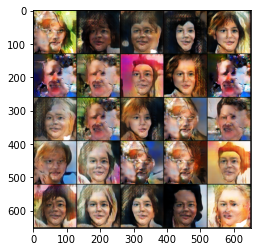

In [57]:
show_tensor_images(image)